In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Tensorflow-Models

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1oP3ewZgiatY88SU5esvVcTCqbdfjYu1d/Tensorflow-Models


In [2]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/surgical_instruments/images/train")
count_images("datasets/surgical_instruments/images/valid")

Total images: 2855
Total images: 841


In [ ]:
# Check train annotations
with open("datasets/surgical_instruments/annotations/instances_train.json") as f:
    train_data = json.load(f)
    print(f"Train images: {len(train_data['images'])}")
    print(f"Train annotations: {len(train_data['annotations'])}")
    print(f"Categories: {train_data['categories']}")

# Check validation
with open("datasets/surgical_instruments/annotations/instances_valid.json") as f:
    valid_data = json.load(f)
    print(f"\nValid images: {len(valid_data['images'])}")
    print(f"Valid annotations: {len(valid_data['annotations'])}")

Train images: 2855
Train annotations: 4895
Categories: [{'id': 1, 'name': 'Grasper'}, {'id': 2, 'name': 'Harmonic_Ace'}, {'id': 3, 'name': 'Myoma_Screw'}, {'id': 4, 'name': 'Needle_Holder'}, {'id': 5, 'name': 'Suction'}, {'id': 6, 'name': 'Trocar'}]

Valid images: 841
Valid annotations: 1215


In [ ]:
import os
import json
import pandas as pd

CATEGORY_NAMES = [
    "Grasper",
    "Harmonic_Ace",
    "Myoma_Screw",
    "Needle_Holder",
    "Suction",
    "Trocar"
]

def coco_to_multilabel_csv(coco_json_path, images_dir, output_csv_path):
    """
    Convert COCO instance segmentation annotations to
    a multi-label classification CSV file.
    """

    # Load COCO
    with open(coco_json_path, "r") as f:
        data = json.load(f)

    images = data["images"]
    annotations = data["annotations"]
    categories = data["categories"]

    # Map category_id → index in CATEGORY_NAMES
    category_map = {cat["id"]: cat["name"] for cat in categories}

    # Create a dictionary: image_id → list of category_ids present
    img_to_categories = {img["id"]: set() for img in images}

    for ann in annotations:
        img_id = ann["image_id"]
        cat_id = ann["category_id"]
        img_to_categories[img_id].add(cat_id)

    # Build CSV rows
    rows = []

    for img in images:
        filename = img["file_name"]
        img_id = img["id"]
        present_cats = img_to_categories[img_id]

        # Start row with filename
        row = {"filename": filename}

        # For each category: 1 if present, else 0
        for cname in CATEGORY_NAMES:
            # find category_id for this name
            cat_id = next((c["id"] for c in categories if c["name"] == cname), None)
            row[cname] = 1 if cat_id in present_cats else 0

        rows.append(row)

    # Save CSV
    df = pd.DataFrame(rows)
    df.to_csv(output_csv_path, index=False)
    print(f"Saved: {output_csv_path}")

In [ ]:
# Train
coco_to_multilabel_csv(
    coco_json_path="datasets/surgical_instruments/annotations/instances_train.json",
    images_dir="datasets/surgical_instruments/images/train",
    output_csv_path="datasets/surgical_instruments/_classes_train.csv"
)

# Valid
coco_to_multilabel_csv(
    coco_json_path="datasets/surgical_instruments/annotations/instances_valid.json",
    images_dir="datasets/surgical_instruments/images/valid",
    output_csv_path="datasets/surgical_instruments/_classes_valid.csv"
)

Saved: datasets/surgical_instruments/_classes_train.csv
Saved: datasets/surgical_instruments/_classes_valid.csv


In [2]:
import os
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
train_dir = "/content/gdrive/My Drive/Tensorflow-Models/datasets/surgical_instruments/images/train"
val_dir   = "/content/gdrive/My Drive/Tensorflow-Models/datasets/surgical_instruments/images/valid"

IMG_SIZE = (224, 224)
BATCH_SIZE = 32 # 64 start

CLASS_NAMES = [
    "Grasper",
    "Harmonic_Ace",
    "Myoma_Screw",
    "Needle_Holder",
    "Suction",
    "Trocar"
]   # 6 classes
NUM_CLASSES = len(CLASS_NAMES)
print("Number of classes = ", NUM_CLASSES)

Number of classes =  6


In [4]:
train_csv = pd.read_csv(os.path.join("/content/gdrive/My Drive/Tensorflow-Models/datasets/surgical_instruments/", "_classes_train.csv"))
val_csv   = pd.read_csv(os.path.join("/content/gdrive/My Drive/Tensorflow-Models/datasets/surgical_instruments/", "_classes_valid.csv"))

train_csv.head(), val_csv.head()

(                                            filename  Grasper  Harmonic_Ace  \
 0  Laparoscopic-Surgery-for-Chronic-Ectopic-Pregn...        0             1   
 1  Laparoscopic-Hysterectomy-with-Ureteral-200-_j...        0             1   
 2  Laparoscopic-Hysterectomy-with-Ureteral-232-_j...        1             0   
 3  Laparoscopic-Hysterectomy-with-Ureteral-249-_j...        0             0   
 4  Laparoscopic-Hysterectomy-with-Ureteral-170-_j...        1             1   
 
    Myoma_Screw  Needle_Holder  Suction  Trocar  
 0            0              0        0       0  
 1            0              0        0       0  
 2            0              1        0       0  
 3            0              1        0       0  
 4            0              0        0       0  ,
                                             filename  Grasper  Harmonic_Ace  \
 0  Laparoscopic-Hysterectomy-with-Ureteral-167-_j...        1             1   
 1  Laparoscopic-Hysterectomy-with-Ureteral-35-_jp...    

In [5]:
print("Total TRAIN images:", len(train_csv))
print("Total VALID images:", len(val_csv))

print("\nTrain class counts:")
print(train_csv[CLASS_NAMES].sum())
print("\nValid class counts:")
print(val_csv[CLASS_NAMES].sum())

train_label_counts = train_csv[CLASS_NAMES].sum(axis=1)
val_label_counts   = val_csv[CLASS_NAMES].sum(axis=1)

print("\nTrain images with zero labels:", (train_label_counts == 0).sum())
print("Val   images with zero labels:", (val_label_counts == 0).sum())

Total TRAIN images: 2855
Total VALID images: 841

Train class counts:
Grasper           882
Harmonic_Ace     1072
Myoma_Screw       509
Needle_Holder     795
Suction           383
Trocar            497
dtype: int64

Valid class counts:
Grasper          165
Harmonic_Ace     200
Myoma_Screw      200
Needle_Holder    199
Suction          115
Trocar           175
dtype: int64

Train images with zero labels: 159
Val   images with zero labels: 26


In [6]:
def load_image_and_labels(filename, labels, base_path):
    image_path = tf.strings.join([base_path, "/", filename])

    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32) / 255.0

    return image, labels

In [7]:
def build_dataset(df, base_path, shuffle=True):
    filepaths = df["filename"].values
    labels = df[CLASS_NAMES].values.astype("float32")

    ds = tf.data.Dataset.from_tensor_slices((filepaths, labels))

    if shuffle:
        ds = ds.shuffle(1000)

    ds = ds.map(lambda f, l: load_image_and_labels(f, l, base_path),
                num_parallel_calls=tf.data.AUTOTUNE)

    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

In [8]:
train_csv = train_csv[train_csv[CLASS_NAMES].sum(axis=1) > 0].reset_index(drop=True)
val_csv   = val_csv[val_csv[CLASS_NAMES].sum(axis=1) > 0].reset_index(drop=True)

In [9]:
print("Total TRAIN images:", len(train_csv))
print("Total VALID images:", len(val_csv))

print("\nTrain class counts:")
print(train_csv[CLASS_NAMES].sum())
print("\nValid class counts:")
print(val_csv[CLASS_NAMES].sum())

train_label_counts = train_csv[CLASS_NAMES].sum(axis=1)
val_label_counts   = val_csv[CLASS_NAMES].sum(axis=1)

print("\nTrain images with zero labels:", (train_label_counts == 0).sum())
print("Val   images with zero labels:", (val_label_counts == 0).sum())

Total TRAIN images: 2696
Total VALID images: 815

Train class counts:
Grasper           882
Harmonic_Ace     1072
Myoma_Screw       509
Needle_Holder     795
Suction           383
Trocar            497
dtype: int64

Valid class counts:
Grasper          165
Harmonic_Ace     200
Myoma_Screw      200
Needle_Holder    199
Suction          115
Trocar           175
dtype: int64

Train images with zero labels: 0
Val   images with zero labels: 0


In [11]:
missing = []
for f in train_csv["filename"]:
    p = os.path.join(train_dir, f)
    if not os.path.exists(p):
        missing.append(f)

len(missing), missing[:10]

(0, [])

In [10]:
train_dataset = build_dataset(train_csv, train_dir, shuffle=True)
val_dataset   = build_dataset(val_csv, val_dir,   shuffle=False)

In [ ]:
for img, label in train_dataset.take(5):
    print(tf.reduce_mean(img).numpy(), img.shape)

0.46527737 (64, 224, 224, 3)
0.46671274 (64, 224, 224, 3)
0.48085874 (64, 224, 224, 3)
0.47444344 (64, 224, 224, 3)
0.47896 (64, 224, 224, 3)


In [ ]:
for batch_images, batch_labels in train_dataset.take(1):
    print("Images shape:", batch_images.shape)
    print("Labels shape:", batch_labels.shape)
    print("First 5 labels:")
    print(batch_labels[:5].numpy())

Images shape: (64, 224, 224, 3)
Labels shape: (64, 6)
First 5 labels:
[[0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0.]]


In [ ]:
for _, y in train_dataset.take(1):
    print(y[:5])

tf.Tensor(
[[1. 0. 0. 1. 0. 0.]
 [1. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 1.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]], shape=(5, 6), dtype=float32)


In [11]:
# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = tf.keras.applications.EfficientNetV2M(
    include_top=False, weights='imagenet', input_shape=(224,224,3), pooling='max'
)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
    layer.trainable = False

In [14]:
pre_trained_model.summary()

Model: "efficientnetv2-m"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        648 │ rescaling[0][0]   │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      5,184 │ block1b_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │         96 │ block1c_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 53,150,388 (202.75 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 53,150,388 (202.75 MB)

In [12]:
# Choose a layer as the last layer of your base model (e.g., one of the later convolutional layers)
last_layer = pre_trained_model.get_layer('block7e_project_conv')
print('last layer output shape: ', last_layer.output.shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 512)


In [13]:
# Flatten the output layer to 1 dimension
x = tf.keras.layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = tf.keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = tf.keras.layers.Dropout(0.2)(x)
# Add a final layer for classification
x = tf.keras.layers.Dense(NUM_CLASSES, activation="sigmoid")(x)

# Append the dense network to the base model
model = tf.keras.Model(pre_trained_model.input, x)

# Print the model summary. See your dense network connected at the end.
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        648 │ rescaling[0][0]   │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      5,184 │ block1b_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │         96 │ block1c_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 78,185,146 (298.25 MB)

 Trainable params: 25,697,286 (98.03 MB)

 Non-trainable params: 52,487,860 (200.23 MB)

In [17]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
])

In [18]:
# Attach the data augmentation model to the base model
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)

x = model(x)

model_with_aug = tf.keras.Model(inputs, x)

In [19]:
# Set the training parameters
base_learning_rate = 0.0001

model_with_aug.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
    loss="binary_crossentropy",
    metrics=["accuracy"])

In [20]:
import numpy as np

label_counts = train_csv[CLASS_NAMES].sum()  # how many images contain each class
max_count = label_counts.max()

class_weights = {i: float(max_count / label_counts[c])
                 for i, c in enumerate(CLASS_NAMES)}

print("Class weights:\n", class_weights)

Class weights:
 {0: 1.215419501133787, 1: 1.0, 2: 2.106090373280943, 3: 1.3484276729559748, 4: 2.7989556135770237, 5: 2.1569416498993963}


tf.Tensor([0. 1. 1. 0. 0. 0.], shape=(6,), dtype=float32)


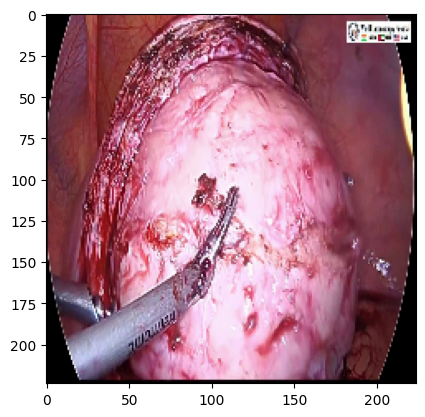

In [22]:
for img, label in train_dataset.take(3):
    plt.imshow(img[0])
    print(label[0])
    break

In [ ]:
EPOCHS = 10

# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "multi_label_EfficientNet.weights.h5"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="loss",
    save_best_only=True,
    save_weights_only=True,
)

# Train the model.
history = model_with_aug.fit(
    train_dataset,
    validation_data = val_dataset,
    epochs = EPOCHS,
    class_weight=class_weights,
    callbacks=[checkpoint_callback],
    verbose = 2)

Epoch 1/10
43/43 - 1022s - 24s/step - accuracy: 0.2659 - loss: 0.7338 - val_accuracy: 0.2135 - val_loss: 0.5336
Epoch 2/10
43/43 - 50s - 1s/step - accuracy: 0.2582 - loss: 0.7205 - val_accuracy: 0.1890 - val_loss: 0.5443
Epoch 3/10
43/43 - 49s - 1s/step - accuracy: 0.2504 - loss: 0.7276 - val_accuracy: 0.1914 - val_loss: 0.5293
Epoch 4/10
43/43 - 72s - 2s/step - accuracy: 0.2711 - loss: 0.7330 - val_accuracy: 0.1939 - val_loss: 0.5220
Epoch 5/10
43/43 - 39s - 916ms/step - accuracy: 0.2771 - loss: 0.7271 - val_accuracy: 0.2074 - val_loss: 0.5283
Epoch 6/10
43/43 - 37s - 852ms/step - accuracy: 0.2771 - loss: 0.7274 - val_accuracy: 0.2049 - val_loss: 0.5255
Epoch 7/10
43/43 - 43s - 1s/step - accuracy: 0.3082 - loss: 0.7214 - val_accuracy: 0.2012 - val_loss: 0.5298
Epoch 8/10
43/43 - 37s - 861ms/step - accuracy: 0.2864 - loss: 0.7239 - val_accuracy: 0.1902 - val_loss: 0.5309
Epoch 9/10
43/43 - 38s - 876ms/step - accuracy: 0.2953 - loss: 0.7235 - val_accuracy: 0.1963 - val_loss: 0.5323
Epoc

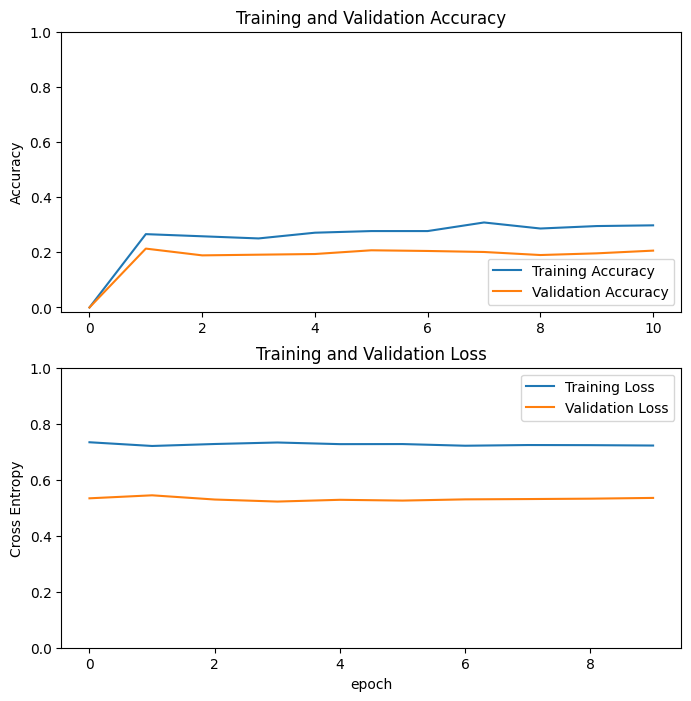

In [ ]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset) # Unpack all 3 returned values
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 1294 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


26/26 ━━━━━━━━━━━━━━━━━━━━ 18s 310ms/step - accuracy: 0.2018 - loss: 0.5334
Validation accuracy: 18.9%


In [21]:
# UnFreeze the weights of the layers.
for layer in pre_trained_model.layers:
    layer.trainable = True

print("Number of layers in the base model: ", len(pre_trained_model.layers))

Number of layers in the base model:  741


In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        648 │ rescaling[0][0]   │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      5,184 │ block1b_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │         96 │ block1c_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 78,185,146 (298.25 MB)

 Trainable params: 77,896,698 (297.15 MB)

 Non-trainable params: 288,448 (1.10 MB)

In [22]:
# Set the training parameters
model_with_aug.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
  loss="binary_crossentropy",
  metrics=["accuracy"])

In [ ]:
fine_tune_epochs = 20
total_epochs =  EPOCHS + fine_tune_epochs

# Train the model.
history_fine = model_with_aug.fit(
    train_dataset,
    validation_data = val_dataset,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1],
    class_weight=class_weights,
    callbacks=[checkpoint_callback],
    verbose = 2)

Epoch 10/30
85/85 - 246s - 3s/step - accuracy: 0.5753 - loss: 0.5131 - val_accuracy: 0.5337 - val_loss: 0.3844
Epoch 11/30
85/85 - 160s - 2s/step - accuracy: 0.6973 - loss: 0.2772 - val_accuracy: 0.6442 - val_loss: 0.3560
Epoch 12/30
85/85 - 175s - 2s/step - accuracy: 0.7370 - loss: 0.1895 - val_accuracy: 0.6748 - val_loss: 0.3382
Epoch 13/30
85/85 - 174s - 2s/step - accuracy: 0.7381 - loss: 0.1408 - val_accuracy: 0.6724 - val_loss: 0.2885
Epoch 14/30
85/85 - 176s - 2s/step - accuracy: 0.7582 - loss: 0.1014 - val_accuracy: 0.7055 - val_loss: 0.3664
Epoch 15/30
85/85 - 182s - 2s/step - accuracy: 0.7637 - loss: 0.0907 - val_accuracy: 0.6258 - val_loss: 0.3513
Epoch 16/30
85/85 - 164s - 2s/step - accuracy: 0.7648 - loss: 0.0698 - val_accuracy: 0.6785 - val_loss: 0.3338
Epoch 17/30
85/85 - 172s - 2s/step - accuracy: 0.7730 - loss: 0.0535 - val_accuracy: 0.7067 - val_loss: 0.3740
Epoch 18/30
85/85 - 165s - 2s/step - accuracy: 0.8090 - loss: 0.0491 - val_accuracy: 0.6748 - val_loss: 0.3727
E

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

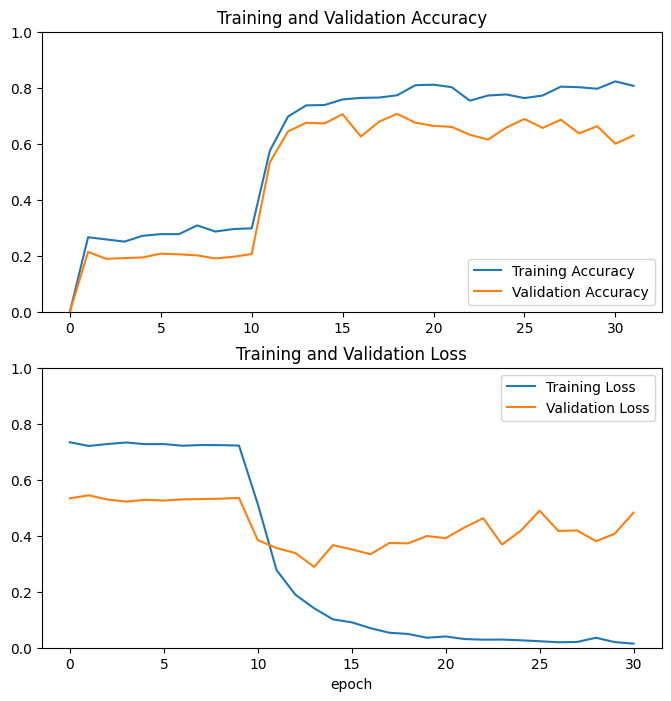

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
# plt.plot([EPOCHS-1,EPOCHS-1],
#           plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
# plt.plot([EPOCHS-1,EPOCHS-1],
#          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset) # Unpack all 3 returned values
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

26/26 ━━━━━━━━━━━━━━━━━━━━ 11s 435ms/step - accuracy: 0.6099 - loss: 0.5405
Validation accuracy: 62.94%


In [ ]:
# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "multi_label_EfficientNet_tune.weights.h5"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="loss",
    save_best_only=True,
    save_weights_only=True,
)

In [ ]:
# Set the training parameters
model_with_aug.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.1*base_learning_rate),
  loss="binary_crossentropy",
  metrics=["accuracy"])

In [ ]:
more_fine_tune_epochs = 20
total_epochs =  EPOCHS + fine_tune_epochs + more_fine_tune_epochs

# Train the model.
history_fine2 = model_with_aug.fit(
    train_dataset,
    validation_data = val_dataset,
    epochs=total_epochs,
    initial_epoch=history_fine.epoch[-1],
    class_weight=class_weights,
    callbacks=[checkpoint_callback],
    verbose = 2)

Epoch 30/50
85/85 - 278s - 3s/step - accuracy: 0.7852 - loss: 0.0105 - val_accuracy: 0.7141 - val_loss: 0.4736
Epoch 31/50
85/85 - 239s - 3s/step - accuracy: 0.7845 - loss: 0.0080 - val_accuracy: 0.6969 - val_loss: 0.4788
Epoch 32/50
85/85 - 193s - 2s/step - accuracy: 0.7990 - loss: 0.0059 - val_accuracy: 0.7031 - val_loss: 0.4882
Epoch 33/50
85/85 - 187s - 2s/step - accuracy: 0.8212 - loss: 0.0047 - val_accuracy: 0.7202 - val_loss: 0.5044
Epoch 34/50
85/85 - 124s - 1s/step - accuracy: 0.8201 - loss: 0.0049 - val_accuracy: 0.7178 - val_loss: 0.5085
Epoch 35/50
85/85 - 191s - 2s/step - accuracy: 0.8212 - loss: 0.0046 - val_accuracy: 0.7092 - val_loss: 0.5179
Epoch 36/50
85/85 - 209s - 2s/step - accuracy: 0.8375 - loss: 0.0043 - val_accuracy: 0.7252 - val_loss: 0.5159
Epoch 37/50
85/85 - 200s - 2s/step - accuracy: 0.8364 - loss: 0.0035 - val_accuracy: 0.7067 - val_loss: 0.5134
Epoch 38/50
85/85 - 209s - 2s/step - accuracy: 0.8297 - loss: 0.0023 - val_accuracy: 0.7153 - val_loss: 0.5123
E

In [ ]:
acc += history_fine2.history['accuracy']
val_acc += history_fine2.history['val_accuracy']

loss += history_fine2.history['loss']
val_loss += history_fine2.history['val_loss']

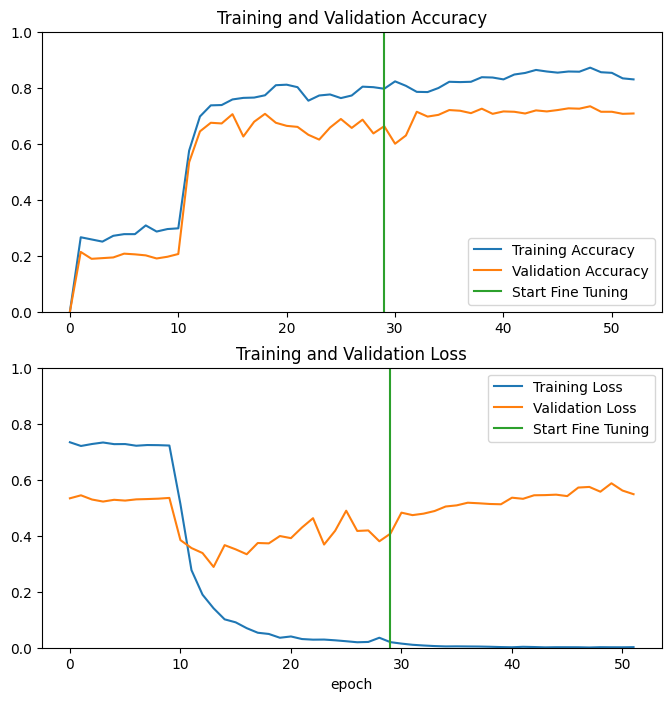

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([30-1,30-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([30-1,30-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset) # Unpack all 3 returned values
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

26/26 ━━━━━━━━━━━━━━━━━━━━ 9s 329ms/step - accuracy: 0.7231 - loss: 0.6641
Validation accuracy: 73.37%


In [23]:
checkpoint_filepath = "multi_label_EfficientNet_tune.weights.h5"

model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset) # Unpack all 3 returned values
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 1294 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


26/26 ━━━━━━━━━━━━━━━━━━━━ 304s 11s/step - accuracy: 0.7231 - loss: 0.6641
Validation accuracy: 73.37%


In [ ]:
img = images_to_show[0][None, ...]
print("Probs:", model_with_aug.predict(img)[0])
print("GT:", labels_to_show[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
Probs: [5.0050546e-03 3.1595968e-04 8.9073492e-06 9.9999166e-01 1.0759988e-02
 3.1387756e-04]
GT: [0. 0. 0. 1. 0. 0.]


In [ ]:
predictions = model_with_aug.predict(images_to_show)
print("Predictions shape:", predictions.shape)  # Should be (N, 6)
print("Sample prediction:", predictions[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
Predictions shape: (18, 6)
Sample prediction: [5.0050332e-03 3.1595968e-04 8.9073492e-06 9.9999166e-01 1.0760039e-02
 3.1387608e-04]


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support

# -----------------------------------------------------------
# CONFIG
# -----------------------------------------------------------
class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw","Needle_Holder","Suction","Trocar"
]
num_classes = len(class_names)

# Choose a global threshold or a per-class thresholds array
threshold = 0.5
# thresholds = np.array([0.3,0.25,0.25,0.3,0.35,0.25])  # optional per-class

# -----------------------------------------------------------
# 1) Collect logits (or probs) and labels from val_dataset
# -----------------------------------------------------------
all_logits = []
all_labels = []

for batch_images, batch_labels in val_dataset:
    logits = model_with_aug(batch_images, training=False)   # returns logits in your setup
    all_logits.append(logits.numpy())
    all_labels.append(batch_labels.numpy())

all_logits = np.vstack(all_logits)   # (N, C)
all_labels = np.vstack(all_labels)   # (N, C)

print("Collected predictions shape:", all_logits.shape)
print("Collected labels shape:", all_labels.shape)

# -----------------------------------------------------------
# 2) Detect whether outputs are logits or probabilities
#    - If any value outside [0,1] -> treat as logits and apply sigmoid
#    - Otherwise assume they are already probabilities
# -----------------------------------------------------------
min_pred, max_pred = all_logits.min(), all_logits.max()
print(f"Prediction range before conversion: min={min_pred:.6f}, max={max_pred:.6f}")

if min_pred < -1.0 or max_pred > 1.0:
    # very likely logits
    all_probs = 1.0 / (1.0 + np.exp(-all_logits))
    print("Detected logits -> applied sigmoid.")
else:
    # could be probabilities already (but still numeric corner-cases exist)
    all_probs = np.clip(all_logits, 0.0, 1.0)
    # print warning if values are suspiciously near 0/1
    print("Detected values in [0,1] -> treating as probabilities (clipped).")

# -----------------------------------------------------------
# 3) Diagnostics: fraction of positive predictions per class
# -----------------------------------------------------------
# choose per-class threshold handling
try:
    thresholds = np.asarray(threshold)
    if thresholds.size == 1:
        thresholds = np.repeat(thresholds, num_classes)
except:
    thresholds = np.repeat(threshold, num_classes)

preds = (all_probs >= thresholds).astype(int)

print("Thresholds = ", thresholds)
pos_frac_per_class = preds.mean(axis=0)   # fraction predicted positive
true_frac_per_class = all_labels.mean(axis=0)

print("\nPer-class positive fractions (predicted vs true):")
for i, name in enumerate(class_names):
    print(f"{name:15s}: pred_frac={pos_frac_per_class[i]:.3f}, true_frac={true_frac_per_class[i]:.3f}")

# If pred_frac is ~1.0 for many classes -> explains recall==1.0 and low precision.
# -----------------------------------------------------------
# 4) Compute per-class precision/recall/f1/support
# -----------------------------------------------------------
precision, recall, f1, support = precision_recall_fscore_support(
    all_labels, preds, average=None, zero_division=0
)

print("\nPer-class results:")
print(f"{'class':15s} {'prec':>7s} {'recall':>7s} {'f1':>7s} {'support':>8s}")
for i, name in enumerate(class_names):
    print(f"{name:15s} {precision[i]:7.4f} {recall[i]:7.4f} {f1[i]:7.4f} {int(support[i]):8d}")

# Macro & micro
p_macro, r_macro, f_macro, _ = precision_recall_fscore_support(all_labels, preds, average="macro", zero_division=0)
p_micro, r_micro, f_micro, _ = precision_recall_fscore_support(all_labels, preds, average="micro", zero_division=0)

print("\nMacro  - Precision: {:.4f}  Recall: {:.4f}  F1: {:.4f}".format(p_macro, r_macro, f_macro))
print("Micro  - Precision: {:.4f}  Recall: {:.4f}  F1: {:.4f}".format(p_micro, r_micro, f_micro))

Collected predictions shape: (815, 6)
Collected labels shape: (815, 6)
Prediction range before conversion: min=0.000000, max=1.000000
Detected values in [0,1] -> treating as probabilities (clipped).
Thresholds =  [0.5 0.5 0.5 0.5 0.5 0.5]

Per-class positive fractions (predicted vs true):
Grasper        : pred_frac=0.281, true_frac=0.202
Harmonic_Ace   : pred_frac=0.334, true_frac=0.245
Myoma_Screw    : pred_frac=0.223, true_frac=0.245
Needle_Holder  : pred_frac=0.294, true_frac=0.244
Suction        : pred_frac=0.069, true_frac=0.141
Trocar         : pred_frac=0.196, true_frac=0.215

Per-class results:
class              prec  recall      f1  support
Grasper          0.6681  0.9273  0.7766      165
Harmonic_Ace     0.7059  0.9600  0.8136      200
Myoma_Screw      0.9560  0.8700  0.9110      200
Needle_Holder    0.7917  0.9548  0.8656      199
Suction          0.8214  0.4000  0.5380      115
Trocar           0.9313  0.8514  0.8896      175

Macro  - Precision: 0.8124  Recall: 0.8272  F1

In [24]:
import numpy as np
from sklearn.metrics import precision_recall_fscore_support

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

# collect predictions (model may return logits OR probabilities)
all_out = []
all_labels = []
for images, labels in val_dataset:
    out = model_with_aug(images, training=False).numpy()
    all_out.append(out)
    all_labels.append(labels.numpy())

all_out = np.vstack(all_out)
all_labels = np.vstack(all_labels)

min_val, max_val = all_out.min(), all_out.max()
print(f"pred range before conversion: min={min_val:.6f}, max={max_val:.6f}")

# If values are not probabilities, convert logits -> probs. Otherwise keep as-is.
if (min_val < 0.0) or (max_val > 1.0):
    probs = 1 / (1 + np.exp(-all_out))   # apply sigmoid ONLY if needed
    print("Applied sigmoid (detected logits).")
else:
    probs = np.clip(all_out, 0.0, 1.0)   # already probabilities
    print("Treated outputs as probabilities (no sigmoid).")

# now threshold safely
threshold = 0.5
preds = (probs >= threshold).astype(int)

# ------------------------------------------------
# 4) Metrics
# ------------------------------------------------
precision, recall, f1, support = precision_recall_fscore_support(
    all_labels, preds, average=None, zero_division=0
)

print("\nPer-class results:")
for i, name in enumerate(class_names):
    print(
        f"{name:15s} | "
        f"Precision: {precision[i]:.4f} | "
        f"Recall: {recall[i]:.4f} | "
        f"F1: {f1[i]:.4f} | "
        f"Support: {int(support[i])}"
    )

# Macro / Micro
p_macro, r_macro, f_macro, _ = precision_recall_fscore_support(
    all_labels, preds, average="macro", zero_division=0
)
p_micro, r_micro, f_micro, _ = precision_recall_fscore_support(
    all_labels, preds, average="micro", zero_division=0
)

print(f"\nMacro  - P: {p_macro:.4f} R: {r_macro:.4f} F1: {f_macro:.4f}")
print(f"Micro  - P: {p_micro:.4f} R: {r_micro:.4f} F1: {f_micro:.4f}")

pred range before conversion: min=0.000000, max=1.000000
Treated outputs as probabilities (no sigmoid).

Per-class results:
Grasper         | Precision: 0.6681 | Recall: 0.9273 | F1: 0.7766 | Support: 165
Harmonic_Ace    | Precision: 0.7059 | Recall: 0.9600 | F1: 0.8136 | Support: 200
Myoma_Screw     | Precision: 0.9560 | Recall: 0.8700 | F1: 0.9110 | Support: 200
Needle_Holder   | Precision: 0.7917 | Recall: 0.9548 | F1: 0.8656 | Support: 199
Suction         | Precision: 0.8214 | Recall: 0.4000 | F1: 0.5380 | Support: 115
Trocar          | Precision: 0.9313 | Recall: 0.8514 | F1: 0.8896 | Support: 175

Macro  - P: 0.8124 R: 0.8272 F1: 0.7991
Micro  - P: 0.7937 R: 0.8577 F1: 0.8244


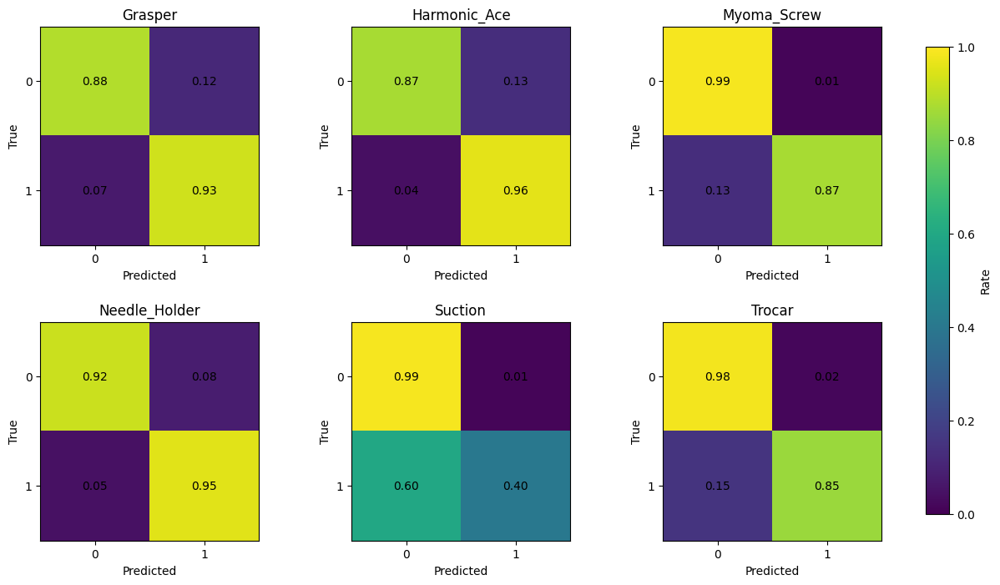

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

for i, name in enumerate(class_names):
    # raw confusion
    cm = confusion_matrix(
        all_labels[:, i],
        preds[:, i],
        labels=[0, 1]
    )

    # normalize by row (true label)
    cm_norm = cm.astype(float)
    row_sum = cm_norm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(cm_norm, row_sum, where=row_sum != 0)

    ax = axes[i]
    im = ax.imshow(cm_norm, vmin=0, vmax=1)
    ax.set_title(name)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(["0", "1"])
    ax.set_yticklabels(["0", "1"])

    # numbers inside cells (rates)
    for (r, c), v in np.ndenumerate(cm_norm):
        ax.text(c, r, f"{v:.2f}", ha="center", va="center")

fig.subplots_adjust(right=0.88, hspace=0.35)
cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cax, label="Rate")
plt.show()

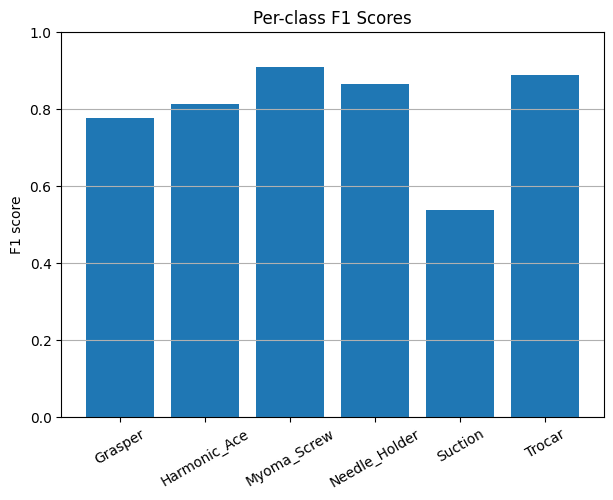

In [27]:
plt.figure(figsize=(7, 5))
plt.bar(class_names, f1)
plt.ylabel("F1 score")
plt.ylim(0, 1)
plt.title("Per-class F1 Scores")
plt.xticks(rotation=30)
plt.grid(axis="y")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


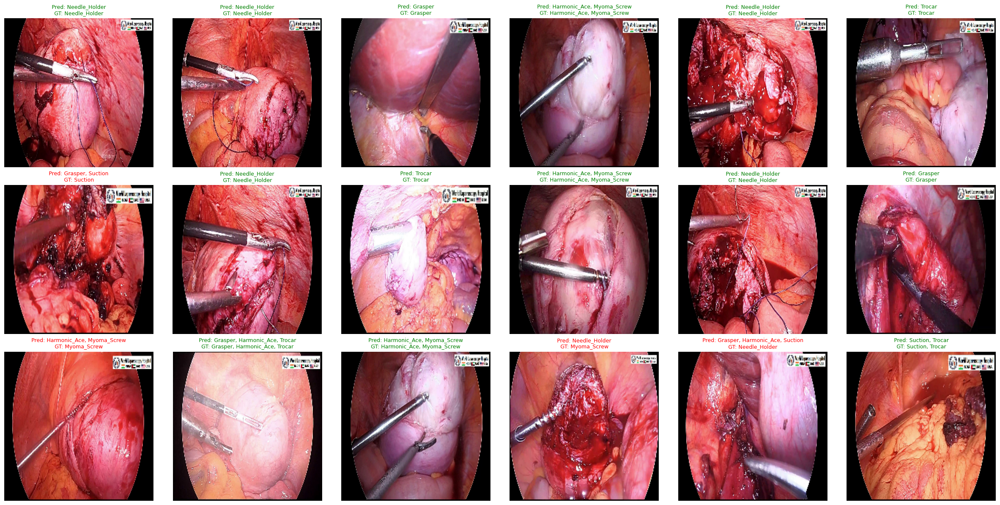

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

class_names = [
    "Grasper",
    "Harmonic_Ace",
    "Myoma_Screw",
    "Needle_Holder",
    "Suction",
    "Trocar"
]

# Number of images to display
N = 18
cols = 6
rows = int(np.ceil(N / cols))

# -------------------------------------------------------
# 1. Use validation dataset (was using train dataset)
# -------------------------------------------------------
val_images = []
val_labels = []

for img, label in val_dataset.unbatch():   # <-- FIXED
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.stack(val_images)
val_labels = np.stack(val_labels)

# -------------------------------------------------------
# 2. Pick random samples
# -------------------------------------------------------
rand_idx = np.random.choice(len(val_images), N, replace=False)

images_to_show = val_images[rand_idx]
labels_to_show = val_labels[rand_idx]

# -------------------------------------------------------
# 3. Model prediction
# -------------------------------------------------------
predictions = model_with_aug.predict(images_to_show)

# Multi-label threshold
threshold = 0.5

# -------------------------------------------------------
# 4. Plot images and results
# -------------------------------------------------------
plt.figure(figsize=(4 * cols, 4 * rows))

for i in range(N):
    img = images_to_show[i]
    true = labels_to_show[i]
    pred_probs = predictions[i]
    pred = (pred_probs >= threshold).astype(int)

    true_names = [class_names[j] for j in range(len(class_names)) if true[j] == 1]
    pred_names = [class_names[j] for j in range(len(class_names)) if pred[j] == 1]

    plt.subplot(rows, cols, i + 1)
    plt.imshow(np.clip(img, 0, 1))
    plt.axis("off")

    # Title in green if correct, red otherwise
    title_color = "green" if np.array_equal(true, pred) else "red"

    plt.title(
        f"Pred: {', '.join(pred_names) if pred_names else 'None'}\n"
        f"GT: {', '.join(true_names)}",
        color=title_color,
        fontsize=9
    )

plt.tight_layout()
plt.show()

In [ ]:
all_probs = []
all_labels = []

for x, y in val_dataset:
    logits = model_with_aug(x, training=False)
    probs = tf.sigmoid(logits).numpy()
    all_probs.append(probs)
    all_labels.append(y.numpy())

all_probs = np.vstack(all_probs)
all_labels = np.vstack(all_labels)

from sklearn.metrics import f1_score

thresholds = np.linspace(0.05, 0.95, 91)
best_thresholds = []

for c in range(all_probs.shape[1]):
    best_f1 = 0
    best_t = 0.5

    for t in thresholds:
        preds = (all_probs[:, c] >= t).astype(int)
        f1 = f1_score(all_labels[:, c], preds, zero_division=0)

        if f1 > best_f1:
            best_f1 = f1
            best_t = t

    best_thresholds.append(best_t)
    print(f"{class_names[c]:15s} best_t={best_t:.2f} f1={best_f1:.3f}")

best_thresholds = np.array(best_thresholds)

Grasper         best_t=0.73 f1=0.817
Harmonic_Ace    best_t=0.71 f1=0.838
Myoma_Screw     best_t=0.51 f1=0.930
Needle_Holder   best_t=0.71 f1=0.880
Suction         best_t=0.51 f1=0.611
Trocar          best_t=0.66 f1=0.894


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


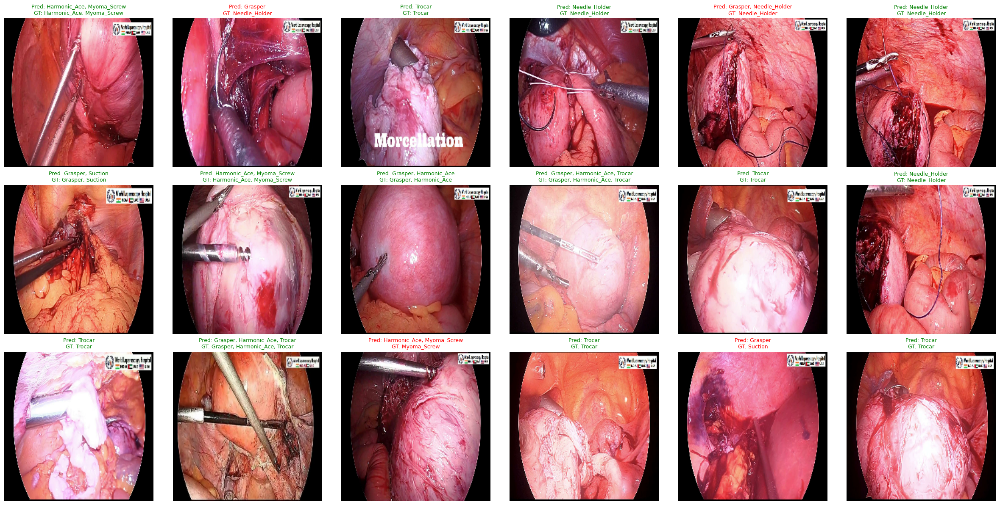

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

class_names = [
    "Grasper",
    "Harmonic_Ace",
    "Myoma_Screw",
    "Needle_Holder",
    "Suction",
    "Trocar"
]

# Number of images to display
N = 18
cols = 6
rows = int(np.ceil(N / cols))

# -------------------------------------------------------
# 1. Use validation dataset (was using train dataset)
# -------------------------------------------------------
val_images = []
val_labels = []

for img, label in val_dataset.unbatch():   # <-- FIXED
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.stack(val_images)
val_labels = np.stack(val_labels)

# -------------------------------------------------------
# 2. Pick random samples
# -------------------------------------------------------
rand_idx = np.random.choice(len(val_images), N, replace=False)

images_to_show = val_images[rand_idx]
labels_to_show = val_labels[rand_idx]

# -------------------------------------------------------
# 3. Model prediction
# -------------------------------------------------------
predictions = model_with_aug.predict(images_to_show)

# -------------------------------------------------------
# 4. Plot images and results
# -------------------------------------------------------
plt.figure(figsize=(4 * cols, 4 * rows))

for i in range(N):
    img = images_to_show[i]
    true = labels_to_show[i]
    pred_probs = predictions[i]
    pred = (pred_probs >= best_thresholds).astype(int)

    true_names = [class_names[j] for j in range(len(class_names)) if true[j] == 1]
    pred_names = [class_names[j] for j in range(len(class_names)) if pred[j] == 1]

    plt.subplot(rows, cols, i + 1)
    plt.imshow(np.clip(img, 0, 1))
    plt.axis("off")

    # Title in green if correct, red otherwise
    title_color = "green" if np.array_equal(true, pred) else "red"

    plt.title(
        f"Pred: {', '.join(pred_names) if pred_names else 'None'}\n"
        f"GT: {', '.join(true_names)}",
        color=title_color,
        fontsize=9
    )

plt.tight_layout()
plt.show()

In [14]:
# removed data augmentation for tflite
inputs = tf.keras.Input(shape=(224, 224, 3))

x = model(inputs)

model_with_aug = tf.keras.Model(inputs, x)

# Set the training parameters
base_learning_rate = 0.0001

model_with_aug.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
    loss="binary_crossentropy",
    metrics=["accuracy"])

checkpoint_filepath = "multi_label_EfficientNet_tune.weights.h5"

model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset) # Unpack all 3 returned values
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 1294 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


26/26 ━━━━━━━━━━━━━━━━━━━━ 57s 879ms/step - accuracy: 0.7231 - loss: 0.6641
Validation accuracy: 73.37%


In [31]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models
model_with_aug.export("multi_label_EfficientNet")

# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("multi_label_EfficientNet")

# No optimizations
tflite_model = converter.convert()
open("Multi_label_EfficientNet.tflite", "wb").write(tflite_model)

Saved artifact at 'multi_label_EfficientNet'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_751')
Output Type:
  TensorSpec(shape=(None, 6), dtype=tf.float32, name=None)
Captures:
  134780125406672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125408208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125407056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125407248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125407440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125408016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125408592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125405136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125408976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134780125405712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13

311263876

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="Multi_label_EfficientNet.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

# Number of images
N = 18
cols = 6
rows = int(np.ceil(N / cols))
threshold = 0.5

# -------------------------------------------------------
# Collect validation data
# -------------------------------------------------------
val_images, val_labels = [], []
for img, label in val_dataset.unbatch():
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.stack(val_images)
val_labels = np.stack(val_labels)

# Sample images
idx = np.random.choice(len(val_images), N, replace=False)
images_to_show = val_images[idx]
labels_to_show = val_labels[idx]

# -------------------------------------------------------
# TFLite inference
# -------------------------------------------------------
predictions = []
for img in images_to_show:
    input_data = np.expand_dims(img, axis=0).astype(input_details[0]["dtype"])
    interpreter.set_tensor(input_details[0]["index"], input_data)
    interpreter.invoke()
    out = interpreter.get_tensor(output_details[0]["index"])[0]
    predictions.append(out)

predictions = np.array(predictions)

# -------------------------------------------------------
# Plot (MULTI-LABEL)
# -------------------------------------------------------
plt.figure(figsize=(4 * cols, 4 * rows))

for i in range(N):
    img = images_to_show[i]
    true = labels_to_show[i]
    probs = predictions[i]

    pred = (probs >= threshold).astype(int)

    true_names = [class_names[j] for j in range(len(class_names)) if true[j] == 1]
    pred_names = [class_names[j] for j in range(len(class_names)) if pred[j] == 1]

    plt.subplot(rows, cols, i + 1)
    plt.imshow(np.clip(img, 0, 1))
    plt.axis("off")

    color = "green" if np.array_equal(true, pred) else "red"
    plt.title(
        f"Pred: {', '.join(pred_names) if pred_names else 'None'}\n"
        f"GT: {', '.join(true_names)}",
        fontsize=9,
        color=color
    )

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="Multi_label_EfficientNet.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

# Number of images
N = 18
cols = 6
rows = int(np.ceil(N / cols))
threshold = 0.5

# -------------------------------------------------------
# Collect validation data
# -------------------------------------------------------
val_images, val_labels = [], []
for img, label in val_dataset.unbatch():
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.stack(val_images)
val_labels = np.stack(val_labels)

# Sample images
idx = np.random.choice(len(val_images), N, replace=False)
images_to_show = val_images[idx]
labels_to_show = val_labels[idx]

# -------------------------------------------------------
# TFLite inference
# -------------------------------------------------------
predictions = []
for img in images_to_show:
    input_data = np.expand_dims(img, axis=0).astype(input_details[0]["dtype"])
    interpreter.set_tensor(input_details[0]["index"], input_data)
    interpreter.invoke()
    out = interpreter.get_tensor(output_details[0]["index"])[0]
    predictions.append(out)

predictions = np.array(predictions)

# -------------------------------------------------------
# Plot (MULTI-LABEL)
# -------------------------------------------------------
plt.figure(figsize=(4 * cols, 4 * rows))

for i in range(N):
    img = images_to_show[i]
    true = labels_to_show[i]
    probs = predictions[i]

    pred = (probs >= threshold).astype(int)

    true_names = [class_names[j] for j in range(len(class_names)) if true[j] == 1]
    pred_names = [class_names[j] for j in range(len(class_names)) if pred[j] == 1]

    plt.subplot(rows, cols, i + 1)
    plt.imshow(np.clip(img, 0, 1))
    plt.axis("off")

    color = "green" if np.array_equal(true, pred) else "red"
    plt.title(
        f"Pred: {', '.join(pred_names) if pred_names else 'None'}\n"
        f"GT: {', '.join(true_names)}",
        fontsize=9,
        color=color
    )

plt.tight_layout()
plt.show()

In [ ]:
!pip install tf2onnx onnx onnxruntime

In [15]:
full_model_path = "Multi_label_EfficientNet_full.h5"
model_with_aug.save(full_model_path)
print(f"✅ Full model saved to: {full_model_path}")

✅ Full model saved to: Multi_label_EfficientNet_full.h5


In [16]:
import tensorflow as tf
import tf2onnx

# Load your model
model = tf.keras.models.load_model("Multi_label_EfficientNet_full.h5")

# Give it a name if it’s Sequential (so ONNX export has clear I/O)
model._name = "Multi_label_EfficientNet"

# Define ONNX output path
onnx_model_path = "Multi_label_EfficientNet.onnx"

# Create a dummy input spec
spec = (tf.TensorSpec((None, 224, 224, 3), tf.float32, name="input"),)

# Convert model
model_proto, _ = tf2onnx.convert.from_keras(
    model,
    input_signature=spec,
    opset=13,
    output_path=onnx_model_path
)

print(f"✅ Successfully converted to: {onnx_model_path}")

ERROR:tf2onnx.tfonnx:rewriter <function rewrite_constant_fold at 0x7b2a60c27b00>: exception `np.cast` was removed in the NumPy 2.0 release. Use `np.asarray(arr, dtype=dtype)` instead.


✅ Successfully converted to: Multi_label_EfficientNet.onnx


In [17]:
import onnxruntime as ort
import numpy as np

session = ort.InferenceSession("Multi_label_EfficientNet.onnx")
input_name = session.get_inputs()[0].name
output_name = session.get_outputs()[0].name

dummy_input = np.random.rand(1, 224, 224, 3).astype(np.float32)
output = session.run([output_name], {input_name: dummy_input})

print("✅ Output shape:", np.array(output).shape)

✅ Output shape: (1, 1, 6)


In [18]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image

model = tf.keras.models.load_model("Multi_label_EfficientNet_full.h5")

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

threshold = 0.5

img_path = "surgical_instruments.jpg"
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = x / 255.0                      # ✅ normalization
x = np.expand_dims(x, axis=0)

probs = model.predict(x)[0]        # shape: (6,)

# Multi-label decision
pred = (probs >= threshold).astype(int)

pred_names = [class_names[i] for i in range(len(class_names)) if pred[i] == 1]

print("Probabilities:", probs)
print("Predicted labels:", pred_names if pred_names else "None")

1/1 ━━━━━━━━━━━━━━━━━━━━ 27s 27s/step
Probabilities: [9.2305112e-07 1.0000000e+00 9.9999118e-01 2.3329854e-08 1.2537359e-07
 8.0694972e-06]
Predicted labels: ['Harmonic_Ace', 'Myoma_Screw']


In [19]:
import onnxruntime as ort
import numpy as np
import cv2

# Load ONNX model
session = ort.InferenceSession("Multi_label_EfficientNet.onnx")
input_name = session.get_inputs()[0].name
output_name = session.get_outputs()[0].name

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

threshold = 0.5

# Read and preprocess image (no normalization)
img = cv2.imread("surgical_instruments.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))
img = img.astype(np.float32)  # keep 0–255 scale
img = img / 255.0                      # ✅ normalization
img = np.expand_dims(img, axis=0)  # shape [1,224,224,3]

# Run inference
probs = session.run([output_name], {input_name: img})[0][0]        # shape: (6,)

# Multi-label decision
pred = (probs >= threshold).astype(int)

pred_names = [class_names[i] for i in range(len(class_names)) if pred[i] == 1]

# Show results
print("ONNX output shape:", probs.shape)
print("Probabilities:", probs)
print("Predicted labels:", pred_names if pred_names else "None")

ONNX output shape: (6,)
Probabilities: [8.3446503e-07 1.0000000e+00 9.9999130e-01 5.9604645e-08 1.1920929e-07
 6.4969063e-06]
Predicted labels: ['Harmonic_Ace', 'Myoma_Screw']


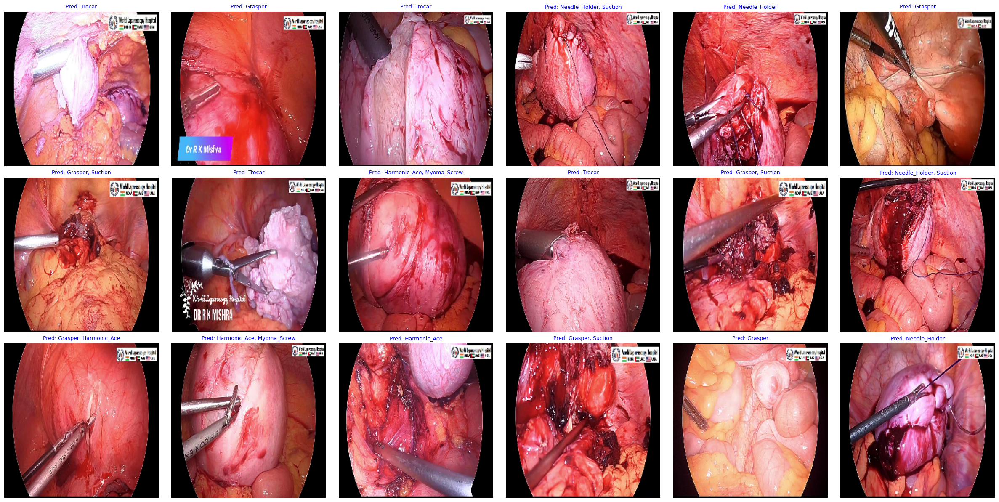

In [23]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import onnxruntime as ort

# ------------------------------
# CONFIG
# ------------------------------
val_dir = "/content/gdrive/My Drive/Tensorflow-Models/datasets/surgical_instruments/images/valid"

class_names = [
    "Grasper","Harmonic_Ace","Myoma_Screw",
    "Needle_Holder","Suction","Trocar"
]

threshold = 0.5
N = 18
cols = 6
rows = int(np.ceil(N / cols))
IMG_SIZE = (224, 224)

# ------------------------------
# Load ONNX model
# ------------------------------
session = ort.InferenceSession("Multi_label_EfficientNet.onnx")
input_name = session.get_inputs()[0].name
output_name = session.get_outputs()[0].name

# ------------------------------
# Pick random images
# ------------------------------
all_imgs = [f for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

selected_imgs = random.sample(all_imgs, N)

# ------------------------------
# Plot
# ------------------------------
plt.figure(figsize=(4 * cols, 4 * rows))

for idx, fname in enumerate(selected_imgs):
    path = os.path.join(val_dir, fname)

    # ---- load & preprocess ----
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    img_norm = img.astype(np.float32) / 255.0
    inp = np.expand_dims(img_norm, axis=0)

    # ---- inference ----
    probs = session.run([output_name], {input_name: inp})[0][0]
    pred = (probs >= threshold).astype(int)

    pred_names = [
        class_names[i] for i in range(len(class_names)) if pred[i] == 1
    ]

    # ---- plot ----
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.axis("off")

    plt.title(
        f"Pred: {', '.join(pred_names) if pred_names else 'None'}",
        color="blue",   # ✅ distinct blue
        fontsize=9
    )

plt.tight_layout()
plt.show()